
# Embedding, Clustering & Annotation - Endocrine Cells
Michael Sterr

2021-06-09 14:38:16      


# Setup

Run following scripts before:
 * scRNA-seq_iPSC_IIR-KO_Embedding-Clustering-Annotation_S6-Only_All-Cells.ipynb

In [1]:
#from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:85% !important; }</style>"))

In [2]:
# General
import scipy as sci
import numpy as np
import pandas as pd
import logging
import time
import pickle
from itertools import chain
import anndata as ad
import gc # Free memory #gc.collect()

#R
#import rpy2
#import rpy2.rinterface_lib.callbacks
#from rpy2.robjects import pandas2ri
#import anndata2ri

# # Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as mcolors
from matplotlib import rcParams
from matplotlib import cm
import seaborn as sb
#from plotnine import *

# # Analysis
import scanpy as sc
import scanpy.external as sce
#import scvelo as scv
#import cellrank as cr

In [3]:
import rpy2
import rpy2.rinterface_lib.callbacks


In [4]:
# Settings

## Scanpy settings
sc.settings.verbosity = 3
#sc.logging.print_versions()

## Scanpy settings
#scv.settings.verbosity = 3
#scv.logging.print_versions()

## Cell Rank settings
#cr.settings.verbosity = 2

## R settings
### Ignore R warning messages
#### Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

### Automatically convert rpy2 outputs to pandas dataframes
#pandas2ri.activate()
#anndata2ri.activate()
#%load_ext rpy2.ipython

#pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 50)
#pd.set_option('display.width', 1000)

# Color Maps

In [5]:
from matplotlib.colors import ListedColormap
# Color maps4
#exec(open("/home/michi/Software/viscm/maps/michi_wt_rd_4.py").read())
#exec(open("/home/michi/Software/viscm/maps/dense.py").read())
#exec(open("/home/michi/Software/viscm/maps/turbo.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_bl_gn_yl.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_or.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_or_2.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_yl.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_yl_2.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_yl_3.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_rd_yl_4.py").read())
#exec(open("/home/michi/Software/viscm/maps/michi_bk_bl_gn.py").read())

ch_YlRd=sb.cubehelix_palette(100, start=.7, rot=.25, gamma=0.6, hue=2, light=1, dark=0.05, as_cmap=True)
ch_Bl=sb.cubehelix_palette(100, start=2.65, rot=0, gamma=0.8, hue=1.8, light=1, dark=0, as_cmap=True)
ch_Bl2=sb.cubehelix_palette(100, start=2.75, rot=-.12, gamma=0.8, hue=1.8, light=1, dark=0, as_cmap=True)
ch_Bl2_2=sb.cubehelix_palette(100, start=2.75, rot=-.12, gamma=0.8, hue=1.8, light=0.9, dark=0, as_cmap=True) #

cm_PuGy=ListedColormap(['#ededed', '#ecebec', '#eae9eb', '#e9e7eb', '#e8e5ea', '#e7e4e9', '#e5e2e8', '#e4e0e7', '#e3dee6', '#e1dce6', '#e0dae5', '#dfd8e4', '#ded7e3', '#dcd5e2', '#dbd3e1', '#dad1e1', '#d8cfe0', '#d7cddf', '#d6cbde', '#d5cadd', '#d3c8dc', '#d2c6dc', '#d1c4db', '#cfc2da', '#cec0d9', '#cdbfd8', '#ccbdd7', '#cabbd7', '#c9b9d6', '#c8b7d5', '#c6b5d4', '#c5b4d3', '#c4b2d2', '#c3b0d2', '#c1aed1', '#c0acd0', '#bfabcf', '#bda9ce', '#bca7cd', '#bba5cd', '#b9a3cc', '#b8a2cb', '#b7a0ca', '#b69ec9', '#b49cc8', '#b39ac8', '#b299c7', '#b097c6', '#af95c5', '#ae93c4', '#ac92c3', '#ab90c2', '#aa8ec2', '#a88cc1', '#a78bc0', '#a689bf', '#a487be', '#a385bd', '#a283bd', '#a182bc', '#9f80bb', '#9e7eba', '#9d7db9', '#9b7bb8', '#9a79b8', '#9977b7', '#9776b6', '#9674b5', '#9572b4', '#9370b3', '#926fb3', '#916db2', '#8f6bb1', '#8e69b0', '#8d68af', '#8b66ae', '#8a64ad', '#8863ad', '#8761ac', '#865fab', '#845daa', '#835ca9', '#825aa8', '#8058a8', '#7f57a7', '#7e55a6', '#7c53a5', '#7b52a4', '#7950a3', '#784ea2', '#774ca2', '#754ba1', '#7449a0', '#72479f', '#71469e', '#70449d', '#6e429d', '#6d409c', '#6b3f9b', '#6a3d9a'])
cm_YlBl=ListedColormap(['#ff7f0e', '#fe7f13', '#fc7f17', '#fb7f1a', '#fa7f1d', '#f87f20', '#f77f23', '#f57f26', '#f47f28', '#f37f2a', '#f17f2d', '#f07f2f', '#ee7f31', '#ed7f33', '#ec7f35', '#ea7f37', '#e97e39', '#e77e3b', '#e67e3d', '#e47e3e', '#e37e40', '#e27e42', '#e07e44', '#df7e45', '#dd7e47', '#dc7e49', '#da7e4a', '#d97e4c', '#d77e4e', '#d67e4f', '#d47e51', '#d37e52', '#d17e54', '#d07e55', '#ce7d57', '#cd7d59', '#cb7d5a', '#ca7d5c', '#c87d5d', '#c67d5f', '#c57d60', '#c37d62', '#c27d63', '#c07d64', '#be7d66', '#bd7d67', '#bb7d69', '#b97c6a', '#b87c6c', '#b67c6d', '#b47c6f', '#b37c70', '#b17c71', '#af7c73', '#ad7c74', '#ac7c76', '#aa7c77', '#a87c79', '#a67c7a', '#a47b7b', '#a37b7d', '#a17b7e', '#9f7b80', '#9d7b81', '#9b7b82', '#997b84', '#977b85', '#957b86', '#937b88', '#917a89', '#8e7a8b', '#8c7a8c', '#8a7a8d', '#887a8f', '#867a90', '#837a92', '#817a93', '#7e7a94', '#7c7996', '#797997', '#777998', '#74799a', '#71799b', '#6f799d', '#6c799e', '#69799f', '#6679a1', '#6278a2', '#5f78a3', '#5c78a5', '#5878a6', '#5478a8', '#5078a9', '#4c78aa', '#4878ac', '#4378ad', '#3d77ae', '#3777b0', '#3177b1', '#2977b3', '#1f77b4'])
cm_GnBl=ListedColormap(['#ffffff', '#fbfdfa', '#f7fcf6', '#f3faf2', '#eff8ef', '#ebf6eb', '#e7f4e8', '#e3f3e5', '#dff1e2', '#dbefde', '#d8eddb', '#d4ebd8', '#d0e9d5', '#cce7d2', '#c8e5cf', '#c5e3cf', '#c2e1ce', '#bfdfce', '#bcdccd', '#b9dacd', '#b6d8cd', '#b3d5cc', '#b0d3cb', '#add1cb', '#aaceca', '#a8ccca', '#a5cac9', '#a2c7c8', '#9fc5c8', '#9cc3c7', '#99c1c6', '#97bec5', '#94bcc5', '#91bac4', '#8eb7c3', '#8cb5c2', '#89b3c1', '#86b1c1', '#84aec0', '#81acbf', '#7eaabe', '#7ca7bd', '#79a5bc', '#77a3bb', '#74a1ba', '#729eb9', '#6f9cb8', '#6d9ab7', '#6a98b5', '#6895b4', '#6593b3', '#6391b2', '#608fb1', '#5e8db0', '#5c8aae', '#5988ad', '#5786ac', '#5584ab', '#5281a9', '#507fa8', '#4e7da7', '#4b7ba5', '#4979a4', '#4776a3', '#4574a1', '#4372a0', '#40709e', '#3e6e9d', '#3c6b9c', '#3a699a', '#386799', '#366597', '#346396', '#326194', '#305e92', '#2e5c91', '#2c5a8f', '#2a588e', '#28568c', '#26548b', '#245289', '#225087', '#204d86', '#1e4b84', '#1c4982', '#1a4781', '#18457f', '#16437d', '#14417b', '#123f7a', '#103d78', '#0e3b76', '#0c3974', '#0a3772', '#083571', '#06336f', '#04316d', '#032f6b', '#012d69', '#002a67'])
cm_Bl=ListedColormap(['#ffffff', '#fbfdfc', '#f7fbfb', '#f4f9f9', '#f0f7f8', '#ecf5f7', '#e9f3f5', '#e5f1f4', '#e2eff3', '#deedf2', '#daebf1', '#d7e9f0', '#d3e7ef', '#cfe5ee', '#cce3ed', '#c8e1ec', '#c4dfeb', '#c1ddea', '#bddbe9', '#b9d9e8', '#b6d7e7', '#b2d5e6', '#aed3e5', '#abd1e4', '#a7cfe3', '#a3cde2', '#9fcbe1', '#9cc8e0', '#9ac6df', '#97c4de', '#95c2dd', '#92bfdc', '#90bddb', '#8ebbda', '#8bb8d8', '#89b6d7', '#86b4d6', '#84b2d5', '#82afd4', '#7fadd2', '#7dabd1', '#7ba9d0', '#78a6cf', '#76a4cd', '#73a2cc', '#71a0cb', '#6f9ec9', '#6d9bc8', '#6a99c6', '#6897c5', '#6695c4', '#6393c2', '#6190c1', '#5f8ebf', '#5d8cbe', '#5a8abc', '#5888bb', '#5686b9', '#5483b8', '#5281b6', '#4f7fb5', '#4d7db3', '#4b7bb2', '#4979b0', '#4777ae', '#4575ad', '#4272ab', '#4070a9', '#3e6ea8', '#3c6ca6', '#3a6aa4', '#3868a3', '#3666a1', '#34649f', '#32629d', '#30609b', '#2e5e9a', '#2c5c98', '#2a5a96', '#285794', '#265592', '#245390', '#23518e', '#214f8c', '#1f4d8a', '#1d4b88', '#1b4986', '#1a4784', '#184582', '#164380', '#14417e', '#133f7c', '#113e7a', '#103c78', '#0e3a76', '#0d3874', '#0b3672', '#0a346f', '#09326d', '#08306b'])
cm_BlBk=ListedColormap(['#ffffff', '#fbfcfe', '#f6fafd', '#f2f7fc', '#eef4fa', '#eaf1f9', '#e6eff8', '#e1ecf6', '#dde9f5', '#d9e7f4', '#d5e4f2', '#d1e1f1', '#cddff0', '#c9dcee', '#c4d9ed', '#c0d7ec', '#bcd4ea', '#b8d1e9', '#b4cfe8', '#afcce6', '#abc9e5', '#a7c7e3', '#a3c4e2', '#9ec2e1', '#9abfdf', '#96bcde', '#91badc', '#8db7db', '#89b5da', '#84b2d8', '#80b0d7', '#7badd5', '#76aad4', '#72a8d2', '#6da5d1', '#68a3d0', '#63a0ce', '#5e9ecd', '#589bcb', '#5399ca', '#4d96c9', '#4794c7', '#4291c5', '#408ec3', '#3f8cc0', '#3e89bd', '#3c86bb', '#3b83b8', '#3a80b5', '#397db3', '#377bb0', '#3678ad', '#3575aa', '#3472a7', '#3270a4', '#316da2', '#306a9f', '#2f679c', '#2e6599', '#2d6296', '#2c5f93', '#2a5d90', '#295a8d', '#28588a', '#275586', '#265283', '#255080', '#244d7d', '#234b7a', '#234876', '#224673', '#214470', '#20416d', '#1f3f69', '#1e3c66', '#1e3a62', '#1d385f', '#1c355c', '#1b3358', '#1b3155', '#1a2e51', '#192c4d', '#182a4a', '#182846', '#172642', '#16233f', '#16213b', '#151f37', '#141d34', '#131b30', '#12192c', '#121728', '#111524', '#101320', '#0e101c', '#0c0d19', '#090a14', '#06070f', '#030308', '#000000'])
cm_CatBl=mcolors.ListedColormap(['#ffffff', '#fdfdfe', '#fbfcfd', '#f9fbfc', '#f7f9fb', '#f5f8fa', '#f3f6f9', '#f1f5f8', '#eff3f7', '#edf2f6', '#ebf0f5', '#e9eff4', '#e7edf3', '#e6ecf2', '#e4eaf1', '#e2e9f0', '#e0e7f0', '#dee6ef', '#dce4ee', '#dae3ed', '#d8e1ec', '#d6e0eb', '#d4deea', '#d2dde9', '#d0dbe8', '#cedae7', '#ccd9e6', '#cad7e5', '#c8d6e4', '#c6d4e3', '#c4d3e2', '#c2d1e1', '#c0d0e0', '#bfcedf', '#bdcdde', '#bbccdd', '#b9cadc', '#b7c9db', '#b5c7da', '#b3c6d9', '#b1c4d8', '#afc3d8', '#adc2d7', '#abc0d6', '#a9bfd5', '#a7bdd4', '#a5bcd3', '#a3bad2', '#a1b9d1', '#9fb8d0', '#9db6cf', '#9bb5ce', '#99b3cd', '#97b2cc', '#95b1cb', '#93afca', '#92aec9', '#90acc8', '#8eabc7', '#8caac6', '#8aa8c5', '#88a7c5', '#86a5c4', '#84a4c3', '#82a3c2', '#80a1c1', '#7ea0c0', '#7c9fbf', '#7a9dbe', '#779cbd', '#759abc', '#7399bb', '#7198ba', '#6f96b9', '#6d95b8', '#6b94b7', '#6992b6', '#6791b5', '#6590b5', '#638eb4', '#608db3', '#5e8cb2', '#5c8ab1', '#5a89b0', '#5888af', '#5586ae', '#5385ad', '#5184ac', '#4f82ab', '#4c81aa', '#4a80a9', '#477ea8', '#457da7', '#427ca7', '#407aa6', '#3d79a5', '#3b78a4', '#3877a3', '#3575a2', '#3274a1'])
cm_CatYl=mcolors.ListedColormap(['#ffffff', '#fffefd', '#fffcfb', '#fffbf8', '#fffaf6', '#fff9f4', '#fff7f2', '#fff6f0', '#fff5ee', '#fff3ec', '#fff2e9', '#fff1e7', '#ffefe5', '#ffeee3', '#ffede1', '#ffecde', '#ffeadc', '#ffe9da', '#ffe8d8', '#ffe6d6', '#ffe5d4', '#ffe4d1', '#ffe2cf', '#ffe1cd', '#ffe0cb', '#ffdec9', '#ffddc6', '#fedcc4', '#fedbc2', '#fed9c0', '#fed8be', '#fed7bc', '#fed5ba', '#fdd4b8', '#fdd3b5', '#fdd2b3', '#fdd0b1', '#fdcfaf', '#fccead', '#fcccab', '#fccba9', '#fccaa7', '#fbc9a5', '#fbc7a2', '#fbc6a0', '#fbc59e', '#fac39c', '#fac29a', '#fac198', '#f9c096', '#f9be94', '#f9bd92', '#f8bc90', '#f8bb8e', '#f8b98c', '#f7b889', '#f7b787', '#f6b685', '#f6b483', '#f6b381', '#f5b27f', '#f5b07d', '#f5af7b', '#f4ae79', '#f4ad77', '#f3ab75', '#f3aa73', '#f2a971', '#f2a86f', '#f1a66d', '#f1a56b', '#f1a468', '#f0a366', '#f0a164', '#efa062', '#ef9f60', '#ee9e5e', '#ee9c5c', '#ed9b5a', '#ed9a58', '#ec9956', '#ec9754', '#eb9652', '#ea9550', '#ea944d', '#e9924b', '#e99149', '#e89047', '#e88f45', '#e78d43', '#e68c41', '#e68b3e', '#e58a3c', '#e5883a', '#e48738', '#e38635', '#e38533', '#e28331', '#e2822e', '#e1812c'])

In [6]:
# Plot settings
%matplotlib inline

## Directory
#sc.settings.figdir='/home/michi/Projects/scMultiome_NVF_Mouse-Pancreas-Development_E14.5_Notebooks/Figures'

## Plotting parameters
#rcParams['figure.figsize']=(20,20) #rescale figures
#sc.set_figure_params(scanpy=True, frameon=False, vector_friendly=False, color_map='tab10' ,transparent=True, dpi=150, dpi_save=300)
#sc.set_figure_params(scanpy=True, frameon=False, vector_friendly=False ,transparent=True, dpi=150, dpi_save=300)

## Font
#rcParams['font.family'] = 'sans-serif'
#rcParams['font.sans-serif'] = ['Source Sans 3']

## Grid & Ticks
#rcParams['grid.alpha'] = 0
#rcParams['xtick.bottom'] = True
#rcParams['ytick.left'] = True

## Embed font
#plt.rc('pdf', fonttype=42)

## Define new default settings
#plt.rcParamsDefault = plt.rcParams

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=False,
                     color_map="YlGnBu", format='pdf', transparent=False,
                     ipython_format='png2x', figsize=(8,8))

# Load Data

In [7]:
adata=sc.read('/Users/dominik.klein/data/E14-E15_adata_filtered_rmDoublets_wnn_graph.h5ad')

# Clustering

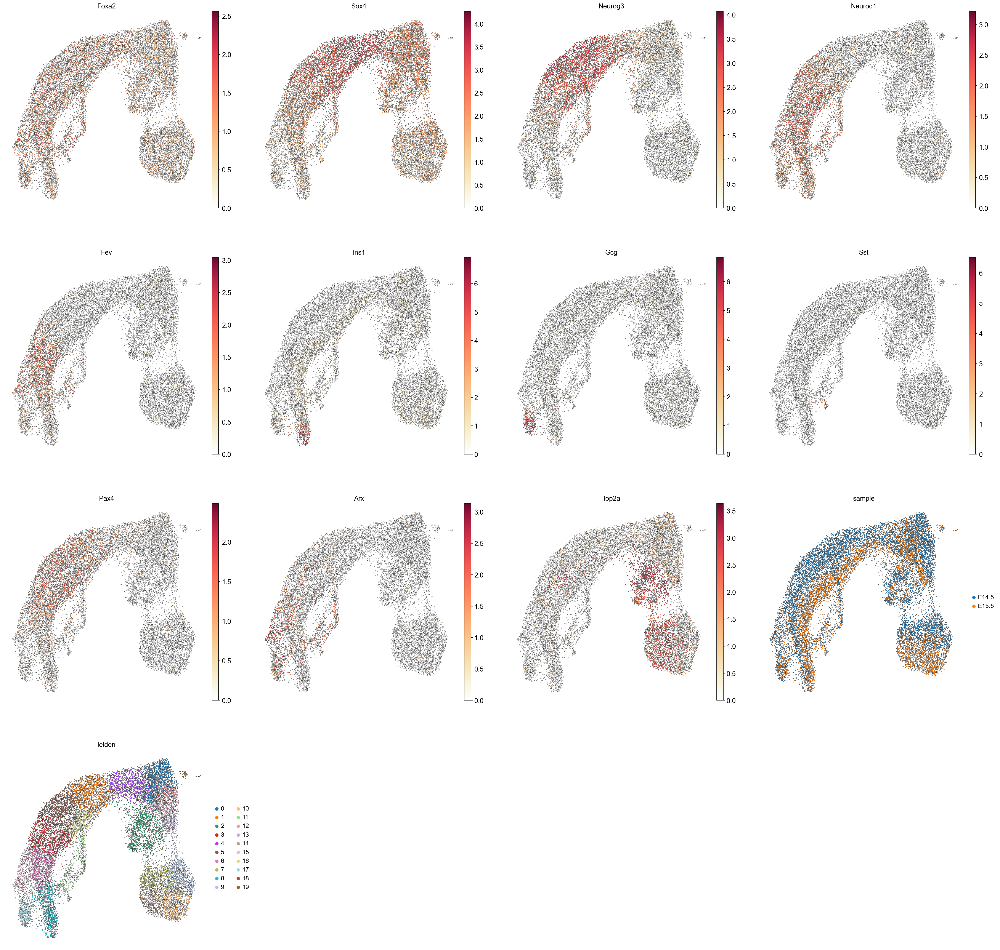

In [17]:
sc.pl.umap(adata, color=['Foxa2','Sox4','Neurog3','Neurod1','Fev','Ins1','Gcg','Sst','Pax4','Arx','Top2a','sample','leiden'], size=5, add_outline=True, alpha=1, outline_width=(0.3, 0.0), color_map=ch_YlRd)

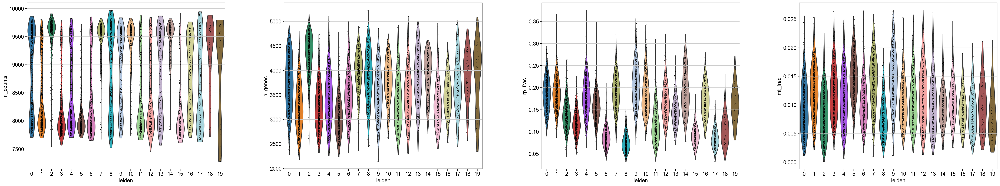

In [18]:
sc.pl.violin(adata, use_raw=False, keys=['n_counts','n_genes','rp_frac','mt_frac'], groupby='leiden')

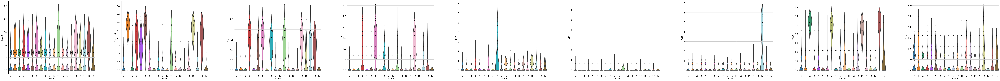

In [19]:
sc.pl.violin(adata, use_raw=False, keys=['Foxa2','Neurog3','Neurod1','Fev','Ins1','Sst','Gcg','Top2a','Krt19'], groupby='leiden')